In [1]:
# imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import corner
import hickle

In [2]:
# plotting style (optional!)
import matplotlib as mpl
from matplotlib import rc
mpl.style.use('classic')
mpl.rcParams['text.usetex'] = True
mpl.rcParams['text.latex.preamble'] = r'\usepackage{mlmodern}'

mpl.rc('xtick', labelsize=27) 
mpl.rc('ytick', labelsize=27)
mpl.rc('xtick', labelsize=27) 
mpl.rc('ytick', labelsize=27)

mpl.rcParams['xtick.major.size'] = 10.0
mpl.rcParams['xtick.major.width'] = 1.75
mpl.rcParams['ytick.major.size'] = 10.0
mpl.rcParams['ytick.major.width'] = 1.75

mpl.rcParams['axes.linewidth'] = 2.0
mpl.rcParams['patch.linewidth'] = 2.0
mpl.rcParams['xtick.major.pad'] = 10.0
mpl.rcParams['ytick.major.pad'] = 10.0

mpl.rcParams['xtick.top'] = False
mpl.rcParams['ytick.right'] = False

mpl.rcParams['xtick.minor.size'] = 5.0
mpl.rcParams['xtick.minor.width'] = 1.75
mpl.rcParams['ytick.minor.size'] = 5.0
mpl.rcParams['ytick.minor.width'] = 1.75

mpl.rcParams['ytick.right'] = True
mpl.rcParams['xtick.top'] = True

import os
os.environ["PATH"] += os.pathsep + '/Library/TeX/texbin'

# Make corner-style plot

In [3]:
# load DR4 exoplanet catalog
DR4_df = pd.read_csv('DR4_mock_exoplanet_catalog.csv', encoding='utf-8')
DR4_df

,Gaia source IDs,True distance [pc],True RA [deg],True Dec [deg],Stellar mass [M_\odot],G-band mag,True planet mass [M_J],True period [days],True inclination [deg],True eccentricity,...,MCMC period 84th [days],MCMC planet mass 16th [M_J],MCMC planet mass 50th [M_J],MCMC planet mass 84th [M_J],MCMC eccentricity 16th,MCMC eccentricity 50th,MCMC eccentricity 84th,MCMC inclination 16th [deg],MCMC inclination 50th [deg],MCMC inclination 84th [deg]
0,5862916884898276864,159.835,190.564268,-63.578927,0.807,12.367,9.808,1191.884,141.621,0.023,...,1232.368,9.119,9.818,10.632,0.096,0.202,0.320,128.781,135.730,144.010
1,1317376390783150080,90.239,244.451871,27.793075,0.580,13.403,3.701,2540.754,50.376,0.090,...,4861.999,8.409,15.600,24.411,0.070,0.208,0.415,61.216,70.642,75.440
2,6718019348545856512,28.924,287.787845,-38.717515,0.488,11.106,8.175,598.870,45.217,0.455,...,602.278,7.807,8.129,8.490,0.431,0.480,0.533,45.274,48.014,50.597
3,4855934177121615744,191.835,58.027016,-37.663374,1.174,9.702,9.216,1275.843,15.991,0.091,...,1347.237,10.527,12.251,14.942,0.269,0.463,0.672,32.693,43.704,52.816
4,4909108694040252928,141.810,21.036511,-59.052307,0.503,14.423,8.550,760.997,23.396,0.072,...,765.411,8.651,9.471,10.562,0.048,0.168,0.380,23.486,33.306,42.205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7540,4221443919824574976,70.914,299.317909,-4.468372,0.393,13.913,2.446,1424.500,46.637,0.421,...,1466.261,3.096,5.309,15.376,0.567,0.894,0.990,51.615,65.058,79.169
7541,4633205698662519680,99.446,26.459796,-78.719895,0.628,13.371,8.370,566.955,124.612,0.075,...,573.224,8.239,8.972,9.748,0.087,0.210,0.352,121.107,127.336,134.813
7542,2416205668513950080,112.548,2.611860,-16.617056,0.329,15.553,7.489,861.929,65.229,0.100,...,922.406,7.876,9.078,11.448,0.074,0.251,0.717,60.645,70.336,78.411
7543,5870728369607743360,353.655,206.259155,-59.521653,1.227,11.291,7.633,1134.013,33.965,0.016,...,1277.767,12.763,17.467,58.816,0.219,0.716,0.984,45.160,61.505,77.703


In [4]:
# quantities in catalog
DR4_df.keys()

Index(['Gaia source IDs', 'True distance [pc]', 'True RA [deg]',
       'True Dec [deg]', 'Stellar mass [M_\odot]', 'G-band mag',
       'True planet mass [M_J]', 'True period [days]',
       'True inclination [deg]', 'True eccentricity', 'True omega [deg]',
       'True Omega [deg]', 'True T_peri [days]', 'Best-fit planet mass [M_J]',
       'Best-fit period [days]', 'Best-fit inclination [deg]',
       'Best-fit eccentricity', 'Best-fit omega [deg]', 'Best-fit Omega [deg]',
       'Best-fit T_peri [days]', 'MCMC distance 16th [pc]',
       'MCMC distance 50th [pc]', 'MCMC distance 84th [pc]',
       'MCMC period 16th [days]', 'MCMC period 50th [days]',
       'MCMC period 84th [days]', 'MCMC planet mass 16th [M_J]',
       'MCMC planet mass 50th [M_J]', 'MCMC planet mass 84th [M_J]',
       'MCMC eccentricity 16th', 'MCMC eccentricity 50th',
       'MCMC eccentricity 84th', 'MCMC inclination 16th [deg]',
       'MCMC inclination 50th [deg]', 'MCMC inclination 84th [deg]'],
      dtyp

In [5]:
# collect properties
DR4_true_dists = np.array(DR4_df['True distance [pc]'])
DR4_stellar_masses = np.array(DR4_df['Stellar mass [M_\odot]'])
DR4_G_mags = np.array(DR4_df['G-band mag'])
DR4_bestfit_planet_masses = np.array(DR4_df['Best-fit planet mass [M_J]'])
DR4_bestfit_periods = np.array(DR4_df['Best-fit period [days]'])/365.25 # convert to years
DR4_bestfit_incs = np.array(DR4_df['Best-fit inclination [deg]'])
DR4_bestfit_eccs = np.array(DR4_df['Best-fit eccentricity'])
DR4_bestfit_semi_as = ((DR4_bestfit_periods)**(2/3))*((DR4_stellar_masses + DR4_bestfit_planet_masses/1047.57)**(1/3))

In [6]:
# load DR4 exoplanet catalog
DR5_df = pd.read_csv('DR5_mock_exoplanet_catalog.csv', encoding='utf-8')
DR5_df

,Gaia source IDs,True distance [pc],True RA [deg],True Dec [deg],Stellar mass [M_\odot],G-band mag,True planet mass [M_J],True period [days],True inclination [deg],True eccentricity,...,MCMC period 84th [days],MCMC planet mass 16th [M_J],MCMC planet mass 50th [M_J],MCMC planet mass 84th [M_J],MCMC eccentricity 16th,MCMC eccentricity 50th,MCMC eccentricity 84th,MCMC inclination 16th [deg],MCMC inclination 50th [deg],MCMC inclination 84th [deg]
0,1914881589484335744,242.027,346.723264,35.231956,0.773,12.987,5.487,2095.254,40.356,0.170,...,2212.359,5.489,5.994,6.515,0.040,0.120,0.228,31.818,41.066,48.745
1,33660762506050688,124.050,42.005258,16.067598,0.961,9.894,3.102,1591.664,59.503,0.345,...,1679.253,2.620,3.314,7.731,0.180,0.556,0.970,49.166,66.446,80.789
2,5980784879311008640,384.556,239.857998,-54.198063,0.759,14.951,6.589,3254.088,157.010,0.188,...,3647.850,8.733,12.552,38.803,0.353,0.791,0.983,104.140,126.410,144.100
3,4448049589813812864,217.991,255.514229,11.896010,0.742,13.214,11.701,3347.988,124.287,0.245,...,3508.997,11.431,11.863,12.298,0.304,0.366,0.427,119.556,122.074,124.715
4,513485472209024640,287.760,35.063695,60.956039,0.764,13.777,9.320,719.829,109.818,0.079,...,730.938,9.742,11.329,15.666,0.185,0.515,0.869,100.655,107.271,114.698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117300,571472822101916928,281.610,67.094840,84.802709,0.726,14.045,6.762,2730.361,38.410,0.196,...,2718.569,6.942,7.563,8.258,0.110,0.237,0.381,29.122,38.302,45.917
117301,5373315940586172672,669.468,170.555140,-48.757228,1.193,12.700,11.706,2129.112,36.280,0.049,...,2210.482,12.092,13.935,18.060,0.084,0.290,0.825,44.936,56.746,67.304
117302,647009030409573248,211.648,148.748183,27.112450,0.328,16.931,4.822,2599.355,53.649,0.043,...,2854.006,9.899,24.410,146.334,0.648,0.982,0.999,61.326,77.810,87.485
117303,6089807809438826752,424.887,211.416711,-51.088260,1.204,11.937,9.897,3381.957,82.457,0.551,...,3862.164,13.041,27.445,80.091,0.835,0.982,0.998,78.047,84.712,88.308


In [7]:
# quantities in catalog
DR5_df.keys()

Index(['Gaia source IDs', 'True distance [pc]', 'True RA [deg]',
       'True Dec [deg]', 'Stellar mass [M_\odot]', 'G-band mag',
       'True planet mass [M_J]', 'True period [days]',
       'True inclination [deg]', 'True eccentricity', 'True omega [deg]',
       'True Omega [deg]', 'True T_peri [days]', 'Best-fit planet mass [M_J]',
       'Best-fit period [days]', 'Best-fit inclination [deg]',
       'Best-fit eccentricity', 'Best-fit omega [deg]', 'Best-fit Omega [deg]',
       'Best-fit T_peri [days]', 'MCMC distance 16th [pc]',
       'MCMC distance 50th [pc]', 'MCMC distance 84th [pc]',
       'MCMC period 16th [days]', 'MCMC period 50th [days]',
       'MCMC period 84th [days]', 'MCMC planet mass 16th [M_J]',
       'MCMC planet mass 50th [M_J]', 'MCMC planet mass 84th [M_J]',
       'MCMC eccentricity 16th', 'MCMC eccentricity 50th',
       'MCMC eccentricity 84th', 'MCMC inclination 16th [deg]',
       'MCMC inclination 50th [deg]', 'MCMC inclination 84th [deg]'],
      dtyp

In [8]:
# collect properties
DR5_true_dists = np.array(DR5_df['True distance [pc]'])
DR5_stellar_masses = np.array(DR5_df['Stellar mass [M_\odot]'])
DR5_G_mags = np.array(DR5_df['G-band mag'])
DR5_bestfit_planet_masses = np.array(DR5_df['Best-fit planet mass [M_J]'])
DR5_bestfit_periods = np.array(DR5_df['Best-fit period [days]'])/365.25 # convert to years
DR5_bestfit_incs = np.array(DR5_df['Best-fit inclination [deg]'])
DR5_bestfit_eccs = np.array(DR5_df['Best-fit eccentricity'])
DR5_bestfit_semi_as = ((DR5_bestfit_periods)**(2/3))*((DR5_stellar_masses + DR5_bestfit_planet_masses/1047.57)**(1/3))

In [9]:
# create 'chain' objects for plotting with corner
DR4_corner_chain = np.array([DR4_true_dists, DR4_stellar_masses, DR4_G_mags, DR4_bestfit_planet_masses, DR4_bestfit_semi_as, DR4_bestfit_periods, DR4_bestfit_incs, DR4_bestfit_eccs]).T
DR5_corner_chain = np.array([DR5_true_dists, DR5_stellar_masses, DR5_G_mags, DR5_bestfit_planet_masses, DR5_bestfit_semi_as, DR5_bestfit_periods, DR5_bestfit_incs, DR5_bestfit_eccs]).T
labels = [r"$r~[\mathrm{pc}]$", r"$M_\star~[M_\odot]$", r"$G$", r"$m_p~[M_\mathrm{J}]$", r"$a~[\mathrm{AU}]$",
          r"$P_\mathrm{orb}~[\mathrm{yr}]$", r"$i~[\mathrm{deg}]$", r"$e$",]

In [10]:
# make plot
fig = plt.figure(figsize=(14*1.6,14*1.6), facecolor='white', dpi=600)

corner.corner(DR5_corner_chain, labels=labels, fig=fig, label_kwargs = {"fontsize": 30}, labelpad=0.02,
              range=[(0.0, 700.0), (0.1, 1.6), (7.0, 19.0), (0.0, 13.0), (0.0, 7.0), (0.0, 14.0), (0.0, 180.0), (0.0, 0.9)],
              #levels = [0.864],
              #levels = [0.118, 0.393, 0.675, 0.864],
              levels = [0.393, 0.864],
              contour_kwargs={"linewidths": 3.0},
              plot_datapoints=False, plot_density=True, bins=20, smooth=0.9,
              hist_kwargs={"linewidth": 2.25})

corner.corner(DR4_corner_chain, labels=labels, fig=fig, color='indianred', label_kwargs = {"fontsize": 30}, labelpad=0.02,
              range=[(0.0, 700.0), (0.1, 1.6), (7.0, 19.0), (0.0, 13.0), (0.0, 7.0), (0.0, 14.0), (0.0, 180.0), (0.0, 0.9)],
              #levels = [0.864],
              #levels = [0.118, 0.393, 0.675, 0.864],
              levels = [0.393, 0.864],
              contour_kwargs={"linewidths": 3.0},
              plot_datapoints=False, plot_density=True, bins=20, smooth=0.9,
              hist_kwargs={"visible": False})

# add DR4 distributions (renormalize to compare density with DR5)
axes = np.array(fig.axes).reshape((8, 8))
axes[0, 0].hist(DR4_true_dists, range=(0.0, 700.0), bins=20, weights=np.ones_like(DR4_true_dists)*len(DR5_true_dists)/len(DR4_true_dists), color='indianred', histtype='step', lw=2.25, zorder=10, label='$\mathrm{DR4}$')
axes[0, 0].hist(10, range=(0.0, 1.0), bins=20, color='k', histtype='step', lw=2.25, zorder=10, label='$\mathrm{DR5}$')
axes[0, 0].set_ylim([0, 2.6e4])
axes[0, 0].legend(loc='upper right', handletextpad=0.4, bbox_to_anchor=(1.07, 1.01), frameon=False, fontsize=22)
axes[1, 1].hist(DR4_stellar_masses, range=(0.1, 1.6), bins=20, weights=np.ones_like(DR4_stellar_masses)*len(DR5_stellar_masses)/len(DR4_stellar_masses), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[1, 1].set_ylim([0, 1.85e4])
axes[2, 2].hist(DR4_G_mags, range=(7.0, 19.0), bins=20, weights=np.ones_like(DR4_G_mags)*len(DR5_G_mags)/len(DR4_G_mags), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[2, 2].set_ylim([0, 1.85e4])
axes[3, 3].hist(DR4_bestfit_planet_masses, range=(0.0, 13.0), bins=20, weights=np.ones_like(DR4_bestfit_planet_masses)*len(DR5_bestfit_planet_masses)/len(DR4_bestfit_planet_masses), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[3, 3].set_ylim([0, 1.31e4])
axes[4, 4].hist(DR4_bestfit_semi_as, range=(0.0, 7.0), bins=20, weights=np.ones_like(DR4_bestfit_semi_as)*len(DR5_bestfit_semi_as)/len(DR4_bestfit_semi_as), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[4, 4].set_ylim([0, 3.6e4])
axes[5, 5].hist(DR4_bestfit_periods, range=(0.0, 14.0), bins=20, weights=np.ones_like(DR4_bestfit_periods)*len(DR5_bestfit_periods)/len(DR4_bestfit_periods), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[5, 5].set_ylim([0, 3.7e4])
axes[6, 6].hist(DR4_bestfit_incs, range=(0.0, 180.0), bins=20, weights=np.ones_like(DR4_bestfit_incs)*len(DR5_bestfit_incs)/len(DR4_bestfit_incs), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[6, 6].set_ylim([0, 1.05e4])
axes[7, 7].hist(DR4_bestfit_eccs, range=(0.0, 0.9), bins=20, weights=np.ones_like(DR4_bestfit_eccs)*len(DR5_bestfit_eccs)/len(DR4_bestfit_eccs), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[7, 7].set_ylim([0, 1.33e4])
plt.show()

# Make plot illustrating dependence on detection criteria

In [11]:
# load DR4 master list
DR4_master_df = pd.read_csv('DR4_master_orbital_fits.csv', encoding='utf-8')
DR4_planet_masses = np.array(DR4_master_df['Best-fit planet mass [M_J]'])
DR4_Porb_84ths = np.array(DR4_master_df['MCMC period 84th [days]'])
DR4_Porb_16ths = np.array(DR4_master_df['MCMC period 16th [days]'])
DR4_Delta_chi2s = np.array(DR4_master_df['\Delta \chi^2'])

# default detection criteria
DR4_mask1 = (DR4_planet_masses < 13.0)
DR4_mask2 = (DR4_Delta_chi2s > 50.0)
DR4_mask3 = (DR4_Porb_84ths/DR4_Porb_16ths < 1.5)
len(DR4_Porb_84ths), len(DR4_Porb_16ths), len(DR4_Delta_chi2s)

(29129, 29129, 29129)

In [12]:
# load DR5 master list
DR5_master_df = pd.read_csv('DR5_master_orbital_fits.csv', encoding='utf-8')
DR5_planet_masses = np.array(DR5_master_df['Best-fit planet mass [M_J]'])
DR5_Porb_84ths = np.array(DR5_master_df['MCMC period 84th [days]'])
DR5_Porb_16ths = np.array(DR5_master_df['MCMC period 16th [days]'])
DR5_Delta_chi2s = np.array(DR5_master_df['\Delta \chi^2'])

# default detection criteria
DR5_mask1 = (DR5_planet_masses < 13.0)
DR5_mask2 = (DR5_Delta_chi2s > 50.0)
DR5_mask3 = (DR5_Porb_84ths/DR5_Porb_16ths < 1.5)
len(DR5_Porb_84ths), len(DR5_Porb_16ths), len(DR5_Delta_chi2s)

(269318, 269318, 269318)

In [13]:
# calculate how the number of detections depends on the Delta chi2 threshold
delta_chi2_vals = np.logspace(np.log10(50.0), np.log10(5e5), 50)
num_detections_DR4 = np.zeros(len(delta_chi2_vals))
num_detections_DR5 = np.zeros(len(delta_chi2_vals))
for i in range(len(delta_chi2_vals)):
    num_detections_DR4[i] = np.sum((DR4_mask1 & DR4_mask3) & (delta_chi2_vals[i] < DR4_Delta_chi2s))
    num_detections_DR5[i] = np.sum((DR5_mask1 & DR5_mask3) & (delta_chi2_vals[i] < DR5_Delta_chi2s))

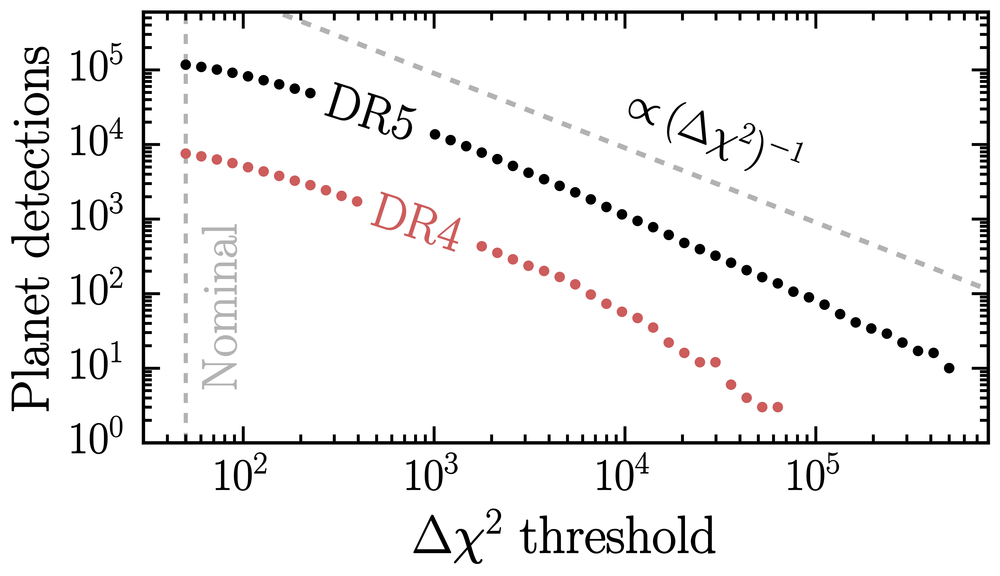

In [14]:
# make plot
fig = plt.figure(figsize=(9.1, 4.5), dpi=600, facecolor='white')
plt.axvline(x=50, c='k', alpha=0.3, lw=2.5, ls='--', zorder=-10)
plt.plot(np.linspace(10, 1e6, 1000), 9.0e7/np.linspace(10, 1e6, 1000), c='k', ls='--', lw=3, alpha=0.3)
plt.scatter(delta_chi2_vals, num_detections_DR5, c='k', edgecolor='none', s=40, label=r'$\mathrm{DR5}$')
plt.scatter(delta_chi2_vals[:39], num_detections_DR4[:39], c='indianred', edgecolor='none', s=40, label=r'$\mathrm{DR4}$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\Delta \chi^2~\mathrm{threshold}$', labelpad=7, fontsize=32)
plt.ylabel(r'$\mathrm{Planet~detections}$', labelpad=7, fontsize=32)
plt.xlim([30, 8e5])
plt.ylim([1, 6e5])

# add label for scaling law
plt.text(3e4, 1.3e4, r'${\propto}\,(\Delta \chi^2)^{-1}$', rotation=-20.5, horizontalalignment='center', verticalalignment='center', fontsize=26)
plt.text(80, 70, r'$\mathrm{Nominal}$', rotation=90, c='k', alpha=0.3, horizontalalignment='center', verticalalignment='center', fontsize=30)


# add DR5 and DR4 labels
plt.annotate(r'$\mathrm{DR5}$', xy=(470, 2.3e4),
                xytext=(0, 0), textcoords='offset points',
                ha='center', va='center',
                fontsize=30,
                color='black',
                bbox=dict(boxstyle="round,pad=0.23", fc="white", ec="none", alpha=1.0),
                zorder=10,
               rotation=-17.5)
plt.annotate(r'$\mathrm{DR4}$', xy=(820, 0.77e3),
                xytext=(0, 0), textcoords='offset points',
                ha='center', va='center',
                fontsize=30,
                color='indianred',
                bbox=dict(boxstyle="round,pad=0.23", fc="white", ec="none", alpha=1.0),
                zorder=10,
               rotation=-18.0)
plt.show()

In [15]:
# calculate how the number of detections depends on the threshold on Porb84th/Porb16th
rel_Porb_precision = np.logspace(np.log10(1.0), np.log10(1e-3), 50)
num_detections_DR4 = np.zeros(len(delta_chi2_vals))
num_detections_DR5 = np.zeros(len(delta_chi2_vals))
for i in range(len(delta_chi2_vals)):
    num_detections_DR4[i] = np.sum((DR4_mask1 & DR4_mask2) & (DR4_Porb_84ths/DR4_Porb_16ths - 1.0 < rel_Porb_precision[i]))
    num_detections_DR5[i] = np.sum((DR5_mask1 & DR5_mask2) & (DR5_Porb_84ths/DR5_Porb_16ths - 1.0 < rel_Porb_precision[i]))

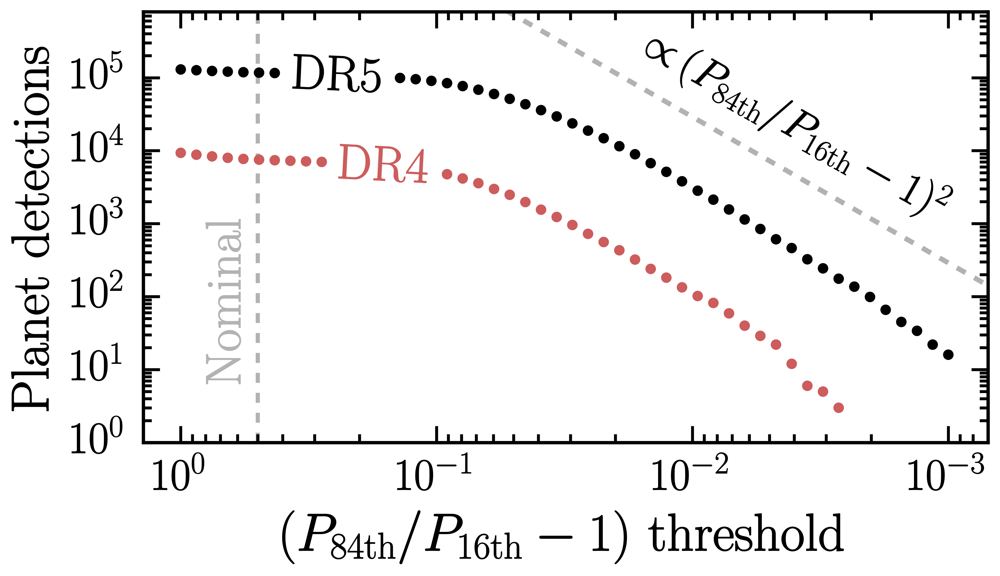

In [16]:
# make plot
logbins = np.logspace(np.log10(50.0), np.log10(1e5), 25)
fig = plt.figure(figsize=(9.1, 4.5), dpi=600, facecolor='white')
plt.axvline(x=0.5, c='k', alpha=0.3, lw=2.5, ls='--', zorder=-10)
plt.plot(np.logspace(-4.0, 0.0, 1000), 2.9e8*(np.logspace(-4.0, 0.0, 1000)**2), c='k', ls='--', lw=3, alpha=0.3)
plt.scatter(rel_Porb_precision, num_detections_DR5, c='k', edgecolor='none', s=40, label=r'$\mathrm{DR5}$')
plt.scatter(rel_Porb_precision[:43], num_detections_DR4[:43], c='indianred', edgecolor='none', s=40, label=r'$\mathrm{DR4}$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$(P_\mathrm{84th}/P_\mathrm{16th} - 1)~\mathrm{threshold}$', labelpad=7, fontsize=32)
plt.ylabel(r'$\mathrm{Planet~detections}$', labelpad=7, fontsize=32)
plt.xlim([1.4, 0.7e-3])
plt.ylim([1, 8e5])

# add label for scaling law
plt.text(3.9e-3, 0.21e5, r'${\propto}\,(P_\mathrm{84th}/P_\mathrm{16th} - 1)^{2}$', rotation=-29.5, horizontalalignment='center', verticalalignment='center', fontsize=26)
plt.text(0.65, 0.9e2, r'$\mathrm{Nominal}$', rotation=90, c='k', alpha=0.3, horizontalalignment='center', verticalalignment='center', fontsize=30)

# add DR5 and DR4 labels
plt.annotate(r'$\mathrm{DR5}$', xy=(0.242, 0.97e5),
                xytext=(0, 0), textcoords='offset points',
                ha='center', va='center',
                fontsize=30,
                color='black',
                bbox=dict(boxstyle="round,pad=0.19", fc="white", ec="none", alpha=1.0),
                zorder=10,
               rotation=-2.5)
plt.annotate(r'$\mathrm{DR4}$', xy=(0.16, 5.6e3),
                xytext=(0, 0), textcoords='offset points',
                ha='center', va='center',
                fontsize=30,
                color='indianred',
                bbox=dict(boxstyle="round,pad=0.21", fc="white", ec="none", alpha=1.0),
                zorder=10,
               rotation=-3.0)

plt.show()

# Alternative corner plot that shows 'intrinsic' volume-limited distributions

In [17]:
# load volume-limited sample of planet-hosting stars to illustrate the observational biases
# these values were collected by randomly assigning planets to a random subset of stars within 700 pc with G < 19
intrinsic_dists, intrinsic_stellar_masses, intrinsic_G_mags, intrinsic_mps, intrinsic_Porbs, intrinsic_incs, intrinsic_eccs = hickle.load('Data/VL_instrinsic_dists.hkl')
intrinsic_semi_as = ((intrinsic_Porbs)**(2/3))*((intrinsic_stellar_masses + intrinsic_mps/1047.57)**(1/3)) # calculate semi-a values

In [18]:
len(intrinsic_dists) # > 400,000 samples in intrinsic distributions

409831

In [19]:
# make plot
fig = plt.figure(figsize=(14*1.6,14*1.6), facecolor='white', dpi=600)

corner.corner(DR5_corner_chain, labels=labels, fig=fig, label_kwargs = {"fontsize": 30}, labelpad=0.02,
              range=[(0.0, 700.0), (0.1, 1.6), (7.0, 19.0), (0.0, 13.0), (0.0, 7.0), (0.0, 14.0), (0.0, 180.0), (0.0, 0.9)],
              #levels = [0.864],
              #levels = [0.118, 0.393, 0.675, 0.864],
              levels = [0.393, 0.864],
              contour_kwargs={"linewidths": 3.0},
              plot_datapoints=False, plot_density=True, bins=20, smooth=0.9,
              hist_kwargs={"linewidth": 2.25})

corner.corner(DR4_corner_chain, labels=labels, fig=fig, color='indianred', label_kwargs = {"fontsize": 30}, labelpad=0.02,
              range=[(0.0, 700.0), (0.1, 1.6), (7.0, 19.0), (0.0, 13.0), (0.0, 7.0), (0.0, 14.0), (0.0, 180.0), (0.0, 0.9)],
              #levels = [0.864],
              #levels = [0.118, 0.393, 0.675, 0.864],
              levels = [0.393, 0.864],
              contour_kwargs={"linewidths": 3.0},
              plot_datapoints=False, plot_density=True, bins=20, smooth=0.9,
              hist_kwargs={"visible": False})

# add DR4 distributions (renormalize to compare density with DR5)
axes = np.array(fig.axes).reshape((8, 8))
axes[0, 0].hist(DR4_true_dists, range=(0.0, 700.0), bins=20, weights=np.ones_like(DR4_true_dists)*len(DR5_true_dists)/len(DR4_true_dists), color='indianred', histtype='step', lw=2.25, zorder=10, label='$\mathrm{DR4}$')
axes[0, 0].hist(10, range=(0.0, 1.0), bins=20, color='k', histtype='step', lw=2.25, zorder=10, label='$\mathrm{DR5}$')
axes[1, 1].hist(DR4_stellar_masses, range=(0.1, 1.6), bins=20, weights=np.ones_like(DR4_stellar_masses)*len(DR5_stellar_masses)/len(DR4_stellar_masses), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[2, 2].hist(DR4_G_mags, range=(7.0, 19.0), bins=20, weights=np.ones_like(DR4_G_mags)*len(DR5_G_mags)/len(DR4_G_mags), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[3, 3].hist(DR4_bestfit_planet_masses, range=(0.0, 13.0), bins=20, weights=np.ones_like(DR4_bestfit_planet_masses)*len(DR5_bestfit_planet_masses)/len(DR4_bestfit_planet_masses), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[4, 4].hist(DR4_bestfit_semi_as, range=(0.0, 7.0), bins=20, weights=np.ones_like(DR4_bestfit_semi_as)*len(DR5_bestfit_semi_as)/len(DR4_bestfit_semi_as), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[5, 5].hist(DR4_bestfit_periods, range=(0.0, 14.0), bins=20, weights=np.ones_like(DR4_bestfit_periods)*len(DR5_bestfit_periods)/len(DR4_bestfit_periods), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[6, 6].hist(DR4_bestfit_incs, range=(0.0, 180.0), bins=20, weights=np.ones_like(DR4_bestfit_incs)*len(DR5_bestfit_incs)/len(DR4_bestfit_incs), color='indianred', histtype='step', lw=2.25, zorder=10)
axes[7, 7].hist(DR4_bestfit_eccs, range=(0.0, 0.9), bins=20, weights=np.ones_like(DR4_bestfit_eccs)*len(DR5_bestfit_eccs)/len(DR4_bestfit_eccs), color='indianred', histtype='step', lw=2.25, zorder=10)

# add normalized intrinsic distributions
axes[0, 0].hist(intrinsic_dists, range=(0.0, 700.0), bins=20, weights=np.ones_like(intrinsic_dists)*len(DR5_true_dists)/len(intrinsic_dists), color='royalblue', histtype='step', lw=2.25, zorder=-10, label='$\mathrm{VL}$')
axes[1, 1].hist(intrinsic_stellar_masses, range=(0.1, 1.6), bins=20, weights=np.ones_like(intrinsic_stellar_masses)*len(DR5_stellar_masses)/len(intrinsic_stellar_masses), color='royalblue', histtype='step', lw=2.25, zorder=-10)
axes[2, 2].hist(intrinsic_G_mags, range=(7.0, 19.0), bins=20, weights=np.ones_like(intrinsic_G_mags)*len(DR5_G_mags)/len(intrinsic_G_mags), color='royalblue', histtype='step', lw=2.25, zorder=-10)
axes[3, 3].hist(intrinsic_mps, range=(0.0, 13.0), bins=20, weights=np.ones_like(intrinsic_mps)*len(DR5_bestfit_planet_masses)/len(intrinsic_mps), color='royalblue', histtype='step', lw=2.25, zorder=-10)
axes[4, 4].hist(intrinsic_semi_as, range=(0.0, 7.0), bins=20, weights=np.ones_like(intrinsic_semi_as)*len(DR5_bestfit_semi_as)/len(intrinsic_semi_as), color='royalblue', histtype='step', lw=2.25, zorder=-10)
axes[5, 5].hist(intrinsic_Porbs, range=(0.0, 14.0), bins=20, weights=np.ones_like(intrinsic_Porbs)*len(DR5_bestfit_periods)/len(intrinsic_Porbs), color='royalblue', histtype='step', lw=2.25, zorder=-10)
axes[6, 6].hist(intrinsic_incs, range=(0.0, 180.0), bins=20, weights=np.ones_like(intrinsic_incs)*len(DR5_bestfit_incs)/len(intrinsic_incs), color='royalblue', histtype='step', lw=2.25, zorder=-10)
axes[7, 7].hist(intrinsic_eccs, range=(0.0, 0.9), bins=20, weights=np.ones_like(intrinsic_eccs)*len(DR5_bestfit_eccs)/len(intrinsic_eccs), color='royalblue', histtype='step', lw=2.25, zorder=-10)

# add legend and set y-axis limits where necessary
axes[0, 0].legend(loc='upper right', handletextpad=0.4, bbox_to_anchor=(1.07, 1.01), frameon=False, fontsize=22)
axes[0, 0].set_ylim([0, 2.6e4])
axes[1, 1].set_ylim([0, 1.95e4])
axes[2, 2].set_ylim([0, 1.95e4])
axes[3, 3].set_ylim([0, 1.35e4])
axes[4, 4].set_ylim([0, 3.6e4])
axes[5, 5].set_ylim([0, 3.7e4])
axes[6, 6].set_ylim([0, 1.05e4])
axes[7, 7].set_ylim([0, 1.8e4])

plt.show()